<a href="https://colab.research.google.com/github/sayakpaul/DataCamp-blogs/blob/master/Histology_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Get the updated setup scripts for `fastai` to run on Colab

In [0]:
# Get the fastai libraries and other important stuff: https://course.fast.ai/start_colab.html
!curl -s https://course.fast.ai/setup/colab | bash
from sklearn.metrics import classification_report

Updating fastai...
Done.


### Authentication and directory setup

In [0]:
# Authenticate Colab to use my Google Drive for data storage and retrieval
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


### Magics and imports

In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
from fastai.vision import *
from fastai.metrics import *

import numpy as np
np.random.seed(7)

import torch 
torch.cuda.manual_seed_all(7)

import matplotlib.pyplot as plt
from matplotlib import pylab

### Setting up the data augmentation steps

In [0]:
tfms = get_transforms(do_flip=True, flip_vert=True, 
                      max_lighting=0.3, max_warp=0.3, max_rotate=20., max_zoom=0.05)
len(tfms)

2

### Loading in the data in mini-btaches of 16 (keeping the same size) and normalizing with `imagenet` stats

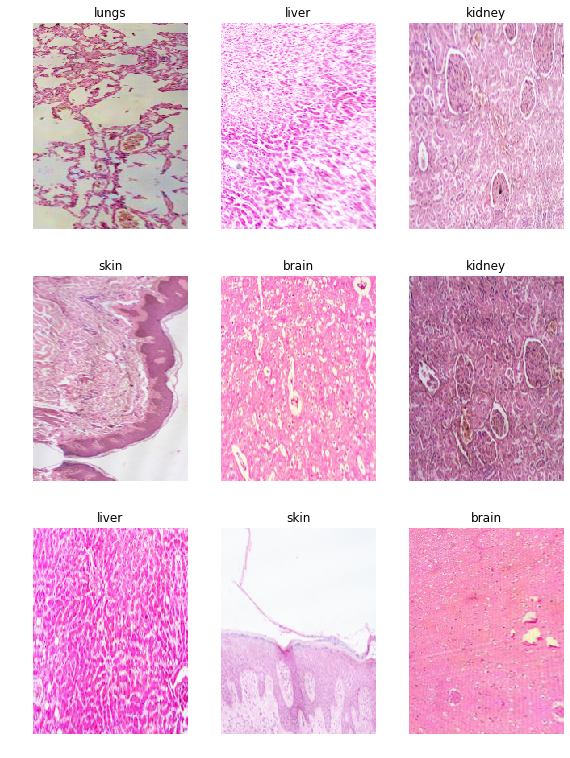

In [0]:
path = '/content/gdrive/My Drive/histo_keras/final_data_randomised_2'
data = ImageDataBunch.from_folder(path, ds_tfms=tfms, valid='val',
                                  size=(256, 192), bs=16).normalize(imagenet_stats)

data.show_batch(rows=3, figsize=(192/24,256/24))

### Data classes and split details

In [0]:
print(data.classes)

['brain', 'intestine', 'kidney', 'liver', 'lungs', 'muscle', 'skin']


### Training with ResNet34 + Mixed precision policy + 1cycle policy

In [0]:
learn = cnn_learner(data, models.resnet34, metrics=accuracy).to_fp16()

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:00<00:00, 114332207.77it/s]


In [0]:
learn.load('stage-2-rn34')

Learner(data=ImageDataBunch;

Train: LabelList (205 items)
x: ImageList
Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192)
y: CategoryList
kidney,kidney,kidney,kidney,kidney
Path: /content/gdrive/My Drive/histo_keras/final_data_randomised_2;

Valid: LabelList (472 items)
x: ImageList
Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192)
y: CategoryList
liver,liver,liver,liver,liver
Path: /content/gdrive/My Drive/histo_keras/final_data_randomised_2;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(

In [0]:
learn.save('stage-2-rn34')

### A bunch of other useful classification performance metrics

In [0]:
data.label_list

LabelLists;

Train: LabelList (205 items)
x: ImageList
Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192)
y: CategoryList
kidney,kidney,kidney,kidney,kidney
Path: /content/gdrive/My Drive/histo_keras/final_data_randomised_2;

Valid: LabelList (472 items)
x: ImageList
Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192),Image (3, 256, 192)
y: CategoryList
liver,liver,liver,liver,liver
Path: /content/gdrive/My Drive/histo_keras/final_data_randomised_2;

Test: None

In [0]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,2.051919,1.061880,0.711864,00:08
1,1.344424,0.258577,0.917373,00:06
2,0.902670,0.195711,0.930085,00:06
3,0.755435,0.148585,0.957627,00:06
4,0.594510,0.132331,0.961864,00:06


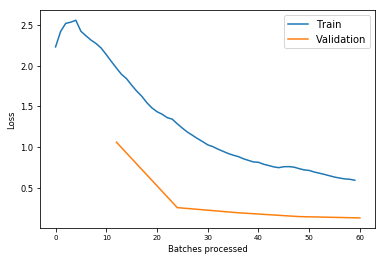

In [0]:
learn.recorder.plot_losses()

In [0]:
learn.save('stage-2-rn34')

In [0]:
learn.validate(learn.data.valid_dl)

[0.1323314, tensor(0.9619)]

In [0]:
def return_classification_report(learn):
    
    ground_truth = []
    pred_labels = []

    for i in range(len(learn.data.valid_ds)):
        temp_pred = str(learn.predict(learn.data.valid_ds[i][0])[0])
        temp_truth = str(learn.data.valid_ds[i]).split('), ', 1)[1].replace('Category ', '').replace(')', '')
        pred_labels.append(temp_pred)
        ground_truth.append(temp_truth)

    assert len(pred_labels) == len(ground_truth)
    
    return classification_report(ground_truth, pred_labels, target_names=data.classes)
  
print(return_classification_report(learn))

              precision    recall  f1-score   support

       brain       0.97      1.00      0.99        70
   intestine       0.94      1.00      0.97        68
      kidney       1.00      0.89      0.94        72
       liver       0.89      1.00      0.94        72
       lungs       0.97      0.97      0.97        80
      muscle       0.98      0.91      0.94        66
        skin       1.00      0.95      0.98        44

    accuracy                           0.96       472
   macro avg       0.97      0.96      0.96       472
weighted avg       0.96      0.96      0.96       472



## Print random images and predictions

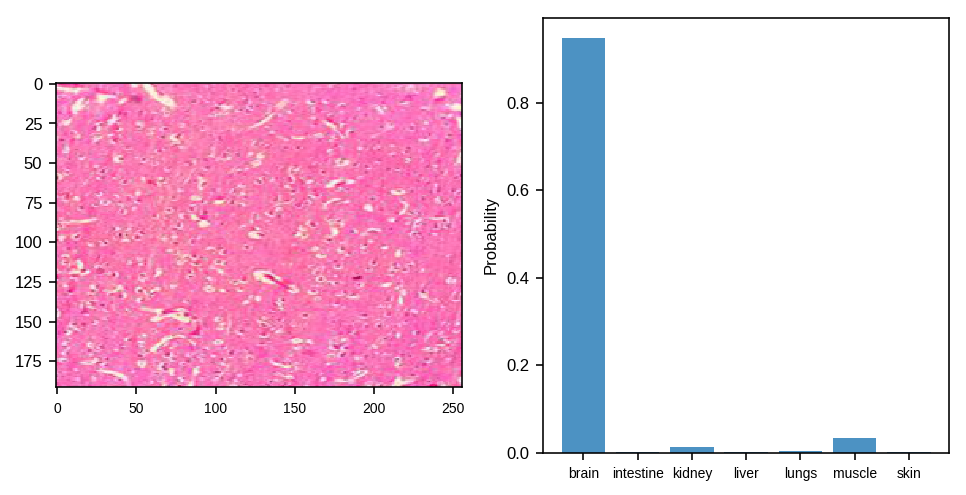

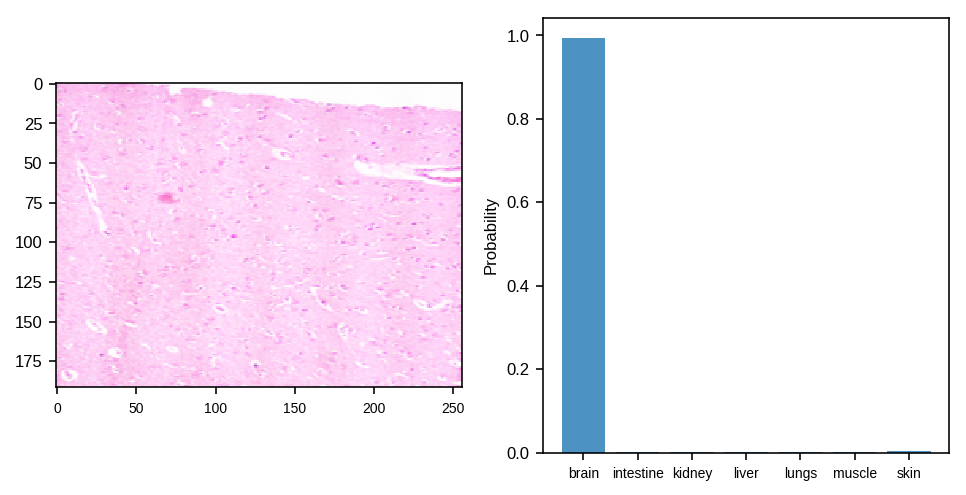

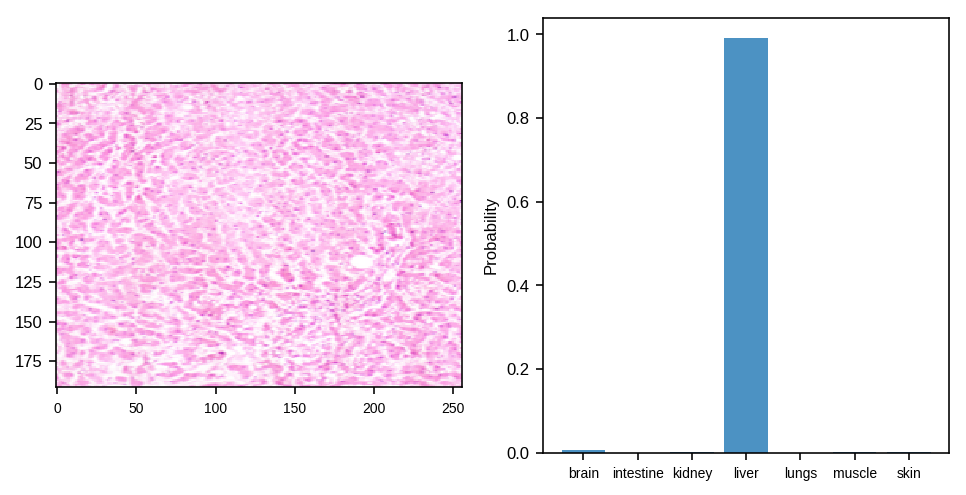

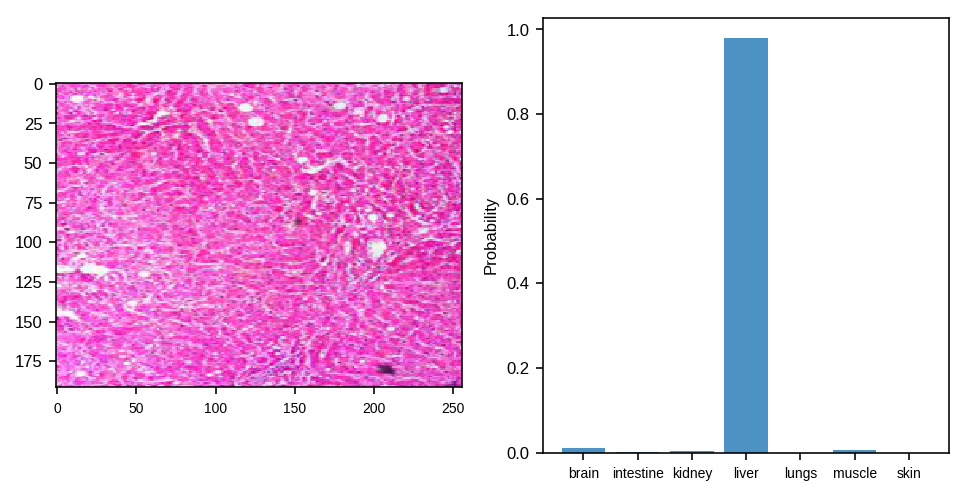

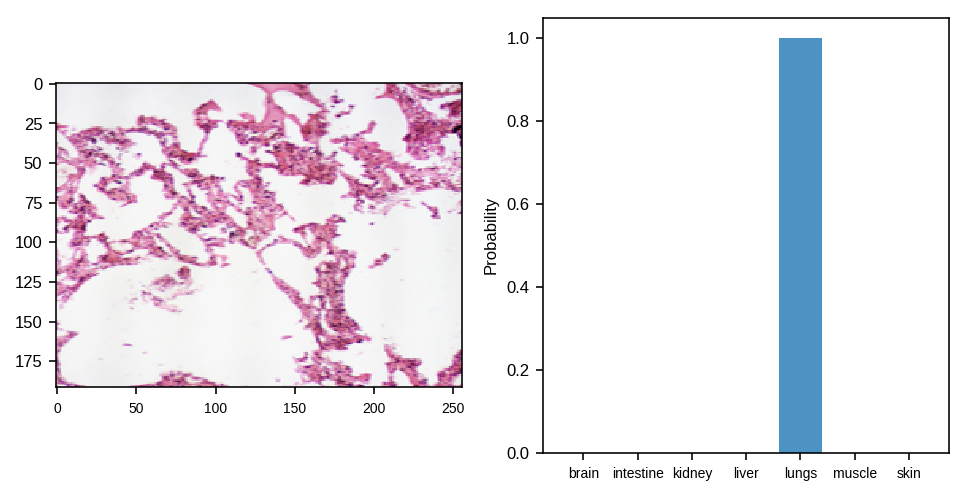

...

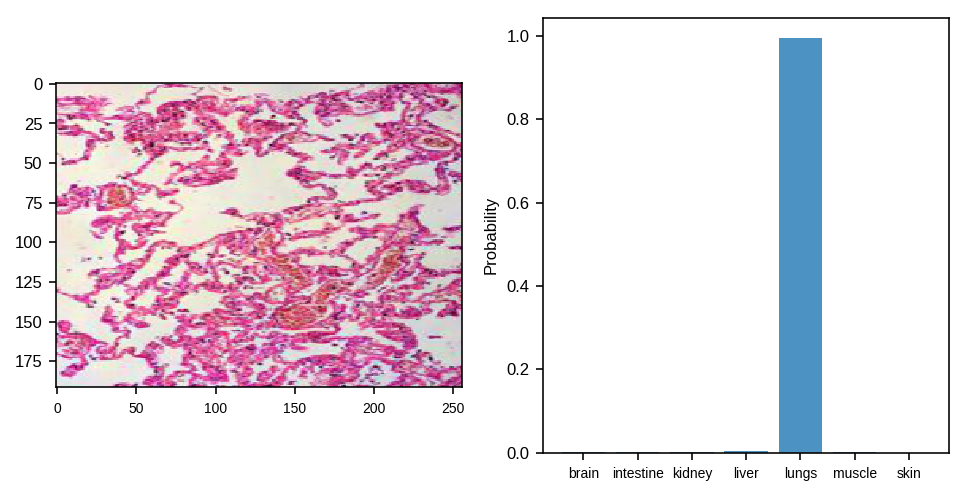

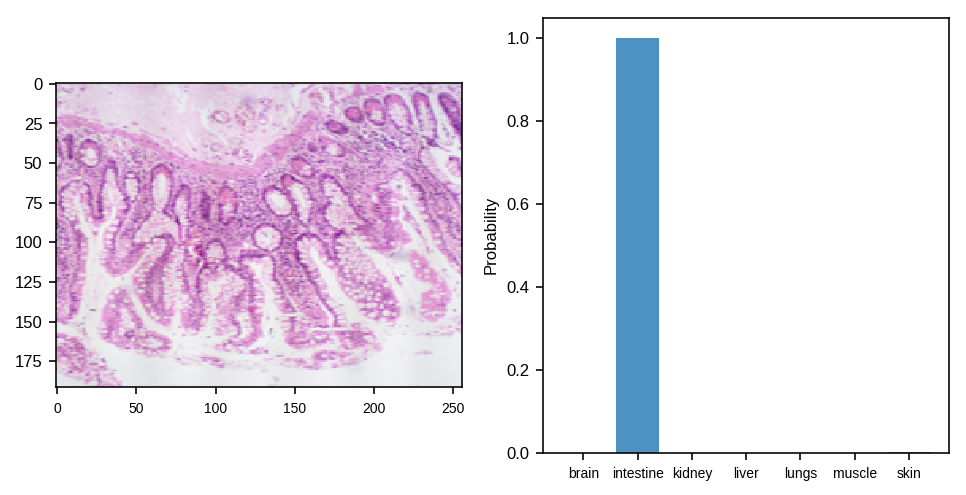

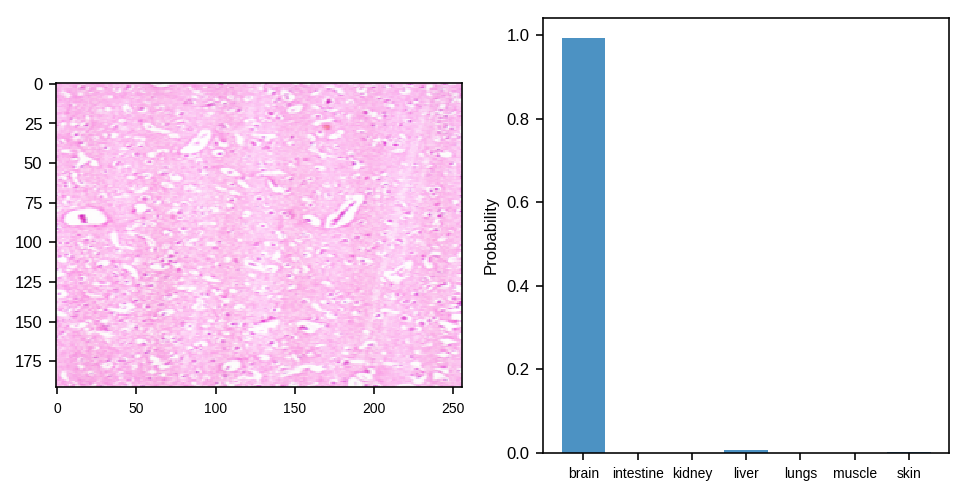

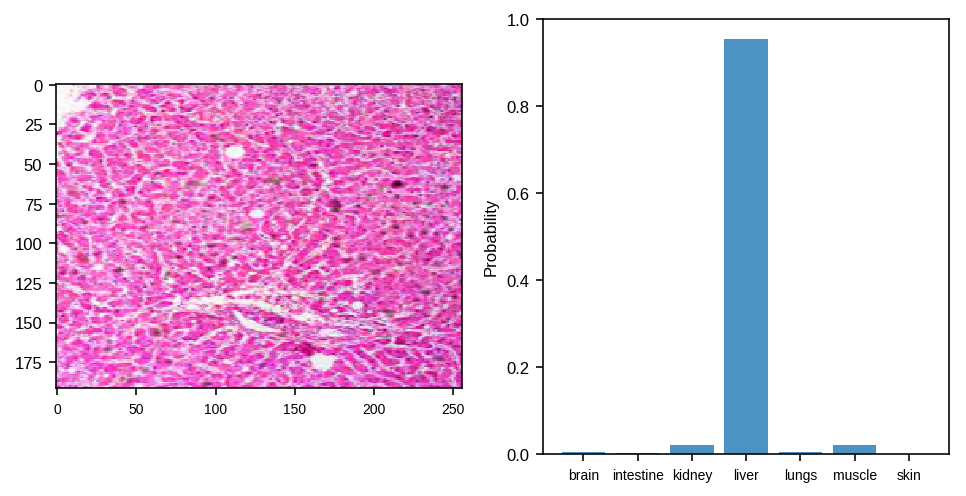

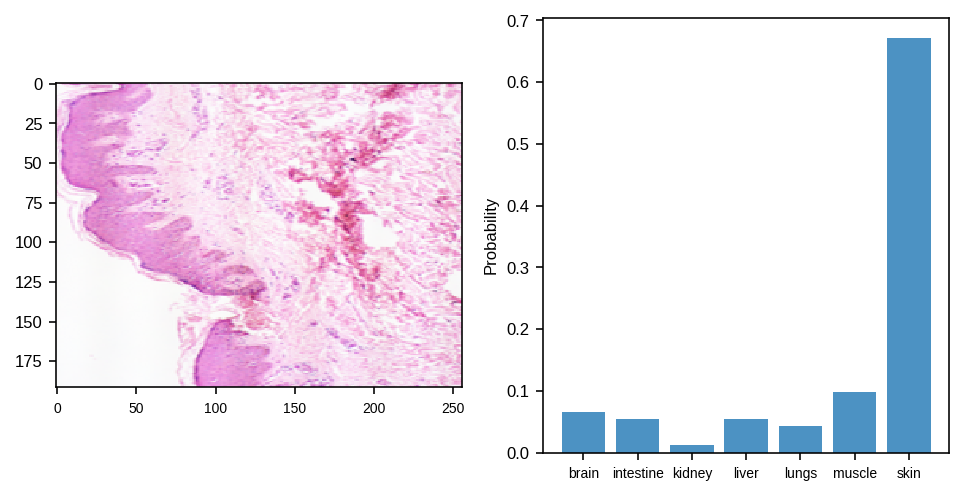

In [0]:
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'small',
         'axes.titlesize':'medium',
         'xtick.labelsize':'x-small',
         'ytick.labelsize':'small',
         'font.family':'liberation sans'}
hfont = {'fontname':'liberation sans'}
pylab.rcParams.update(params)

for i in range(20):
  r = np.random.randint(472)
  p = learn.predict(learn.data.valid_ds[r][0])
  im = learn.data.valid_ds[r][0]
  im = (im.data).numpy()
  im = im.T
  probs = p[2]
  y_pos = np.arange(len(data.classes))
  
  
  plt.figure(dpi=144,figsize=(8,4))
  plt.subplot(121)
  plt.imshow(im)
  plt.subplot(122)
  plt.xticks(y_pos,data.classes,**hfont)
  plt.ylabel('Probability',**hfont)
  plt.yticks(**hfont)
  plt.bar(y_pos,probs.tolist(),alpha=0.8)
  plt.show()

## Print predictions of all images

In [0]:
for i in range(472):
  p = learn.predict(learn.data.valid_ds[i][0])
  orig = learn.data.valid_ds[i][1]
  probs = p[2]
  print("Image %s: Original %s, predicted %s" % (i, orig, data.classes[np.argmax(probs)]))

Image 0: Original liver, predicted liver
Image 1: Original liver, predicted liver
Image 2: Original liver, predicted liver
Image 3: Original liver, predicted liver
Image 4: Original liver, predicted liver
Image 5: Original liver, predicted liver
Image 6: Original liver, predicted liver
Image 7: Original liver, predicted liver
Image 8: Original liver, predicted liver
Image 9: Original liver, predicted liver
Image 10: Original liver, predicted liver
Image 11: Original liver, predicted liver
Image 12: Original liver, predicted liver
Image 13: Original liver, predicted liver
Image 14: Original liver, predicted liver
Image 15: Original liver, predicted liver
Image 16: Original liver, predicted liver
Image 17: Original liver, predicted liver
Image 18: Original liver, predicted liver
Image 19: Original liver, predicted liver
Image 20: Original liver, predicted liver
Image 21: Original liver, predicted liver
Image 22: Original liver, predicted liver
Image 23: Original liver, predicted liver
Im

## List images in all folders recursively

In [0]:
!find . -type f | sed -e 's/[^\\/]*$//' | sort | uniq -c | sort -rn

     80 ./val/lungs/
     72 ./val/liver/
     72 ./val/kidney/
     70 ./val/brain/
     68 ./val/intestine/
     66 ./val/muscle/
     44 ./val/skin/
     34 ./train/lungs/
     32 ./train/kidney/
     30 ./train/liver/
     30 ./train/brain/
     29 ./train/intestine/
     28 ./train/muscle/
     22 ./train/skin/
      1 ./models/


## Print model architecture

In [0]:
learn.summary()

Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 128, 96]        9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 128, 96]        128        True      
______________________________________________________________________
ReLU                 [64, 128, 96]        0          False     
______________________________________________________________________
MaxPool2d            [64, 64, 48]         0          False     
______________________________________________________________________
Conv2d               [64, 64, 48]         36,864     False     
______________________________________________________________________
BatchNorm2d          [64, 64, 48]         128        True      
______________________________________________________________________
ReLU                 [64, 64, 48]         0          False     
___________________________________________________

## Print 40 random predictions

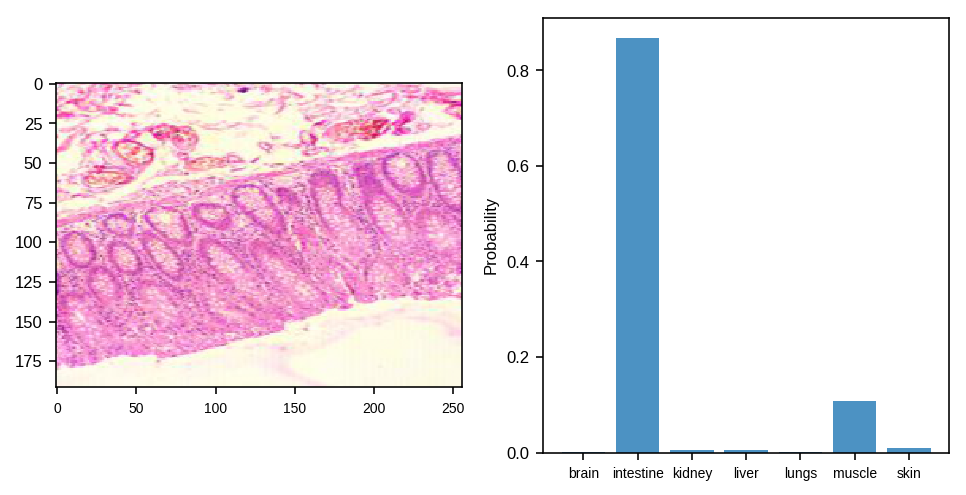

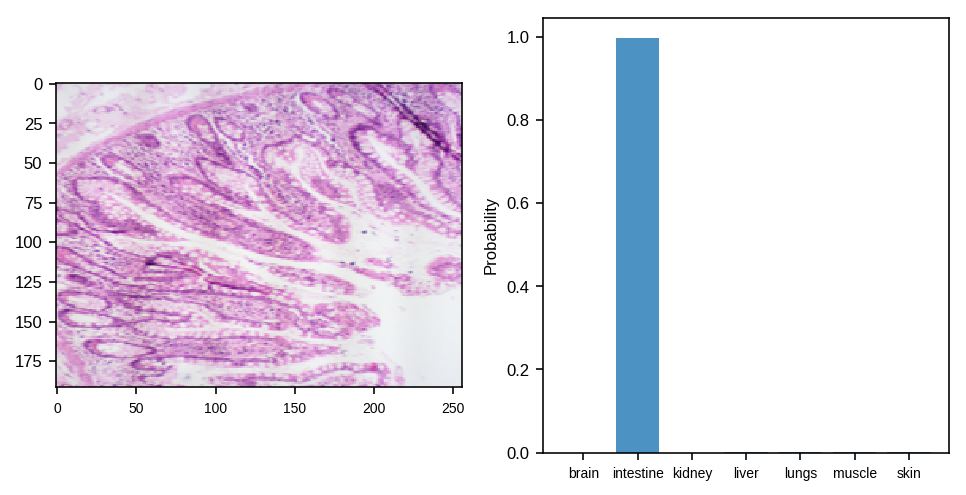

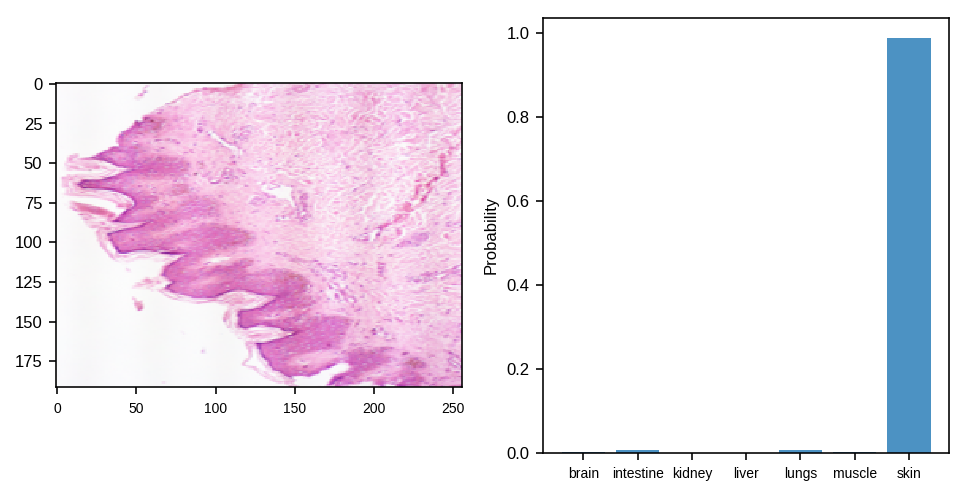

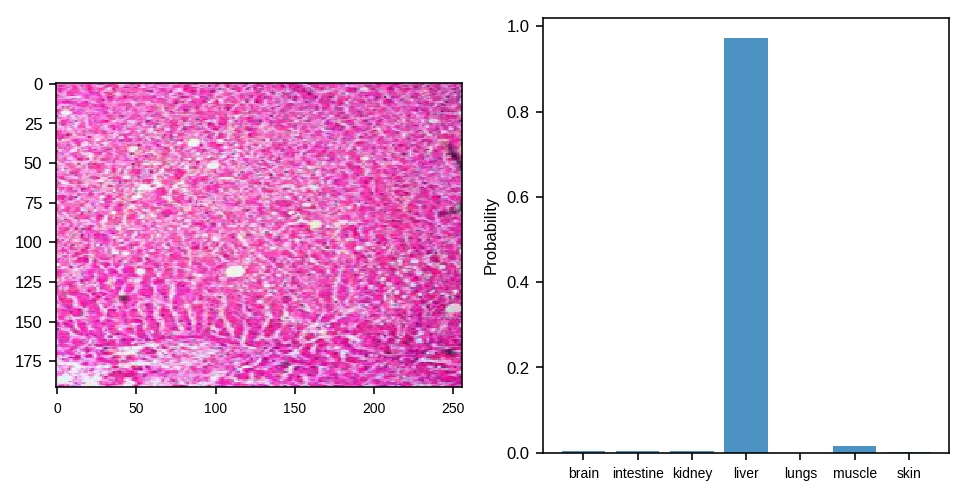

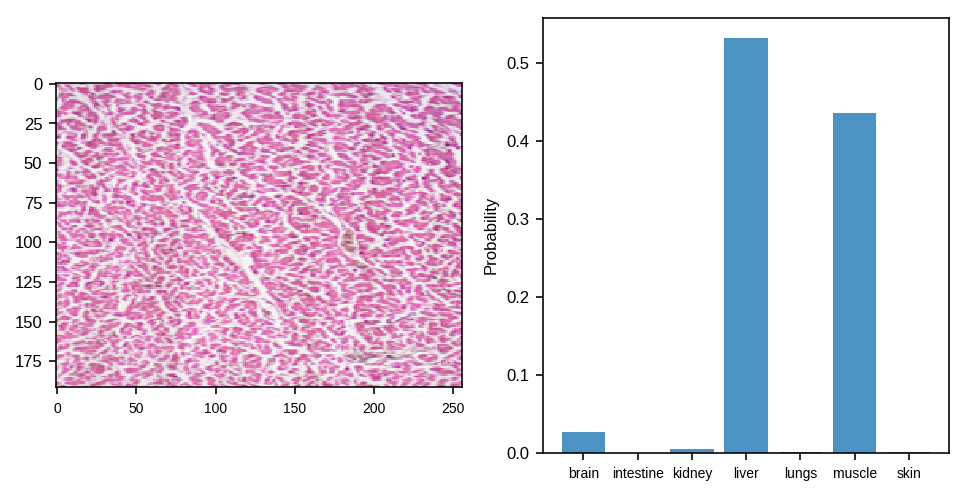

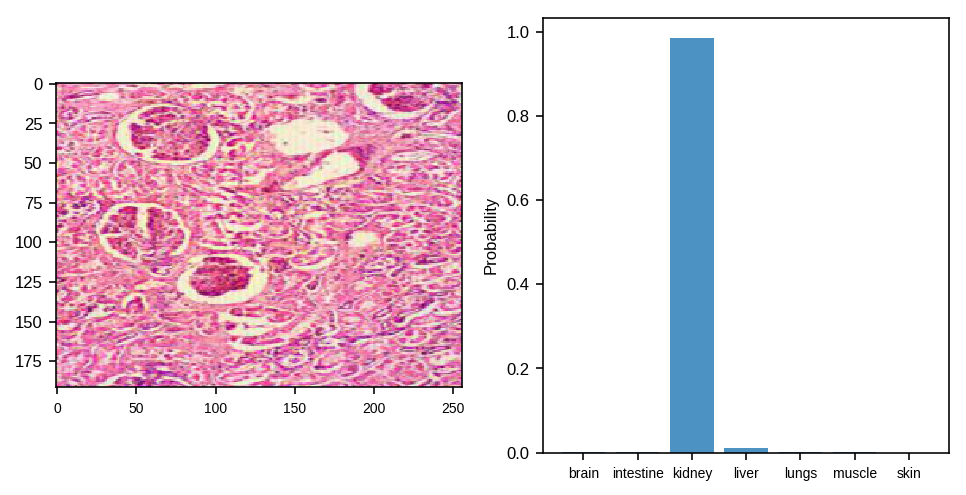

In [0]:
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'small',
         'axes.titlesize':'medium',
         'xtick.labelsize':'x-small',
         'ytick.labelsize':'small',
         'font.family':'liberation sans'}
hfont = {'fontname':'liberation sans'}
pylab.rcParams.update(params)

for i in range(40):
  r = np.random.randint(472)
  p = learn.predict(learn.data.valid_ds[r][0])
  im = learn.data.valid_ds[r][0]
  im = (im.data).numpy()
  im = im.T
  probs = p[2]
  print(probs)
  y_pos = np.arange(len(data.classes))
  
  
  plt.figure(dpi=144,figsize=(8,4))
  plt.subplot(121)
  plt.imshow(im)
  plt.subplot(122)
  plt.xticks(y_pos,data.classes,**hfont)
  plt.ylabel('Probability',**hfont)
  plt.yticks(**hfont)
  plt.bar(y_pos,probs.tolist(),alpha=0.8)
  plt.show()

## Show all the wrong predictions

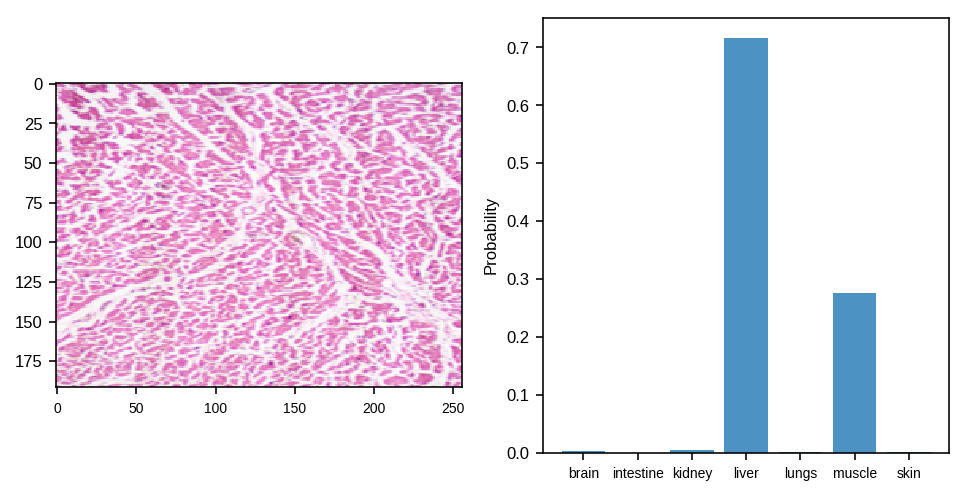

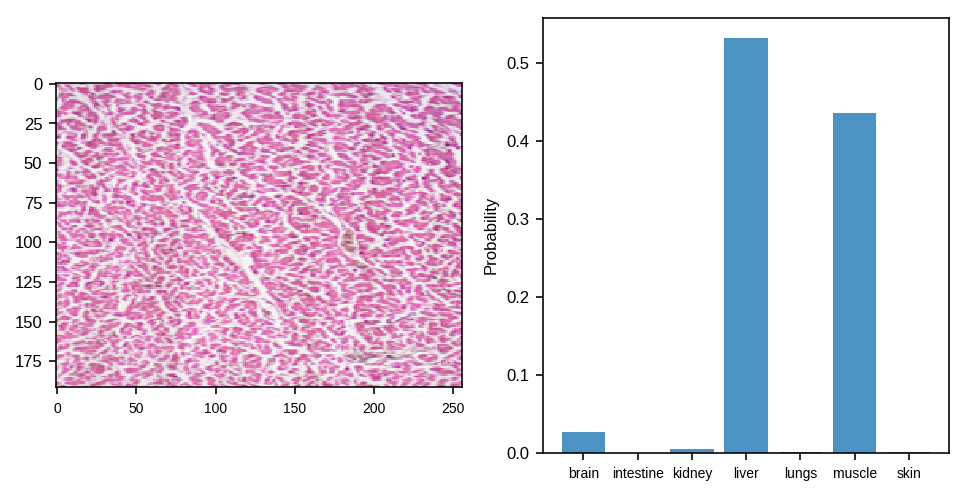

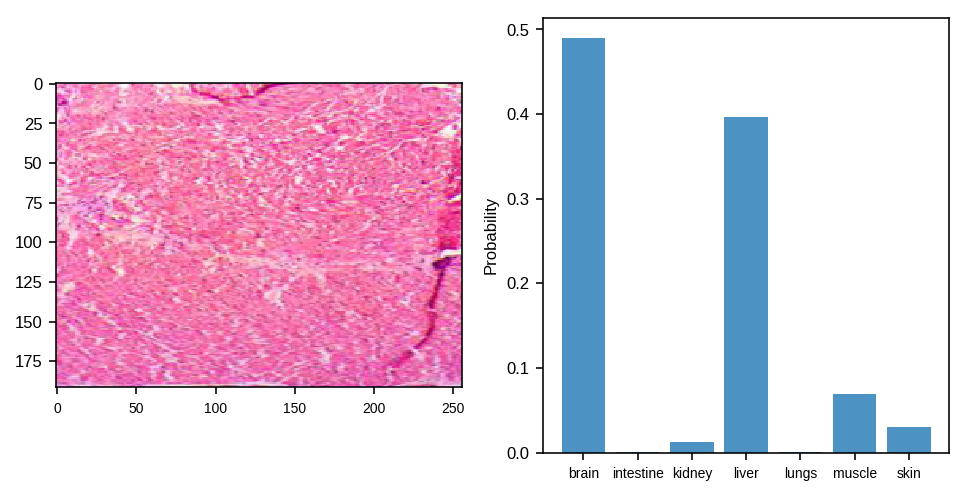

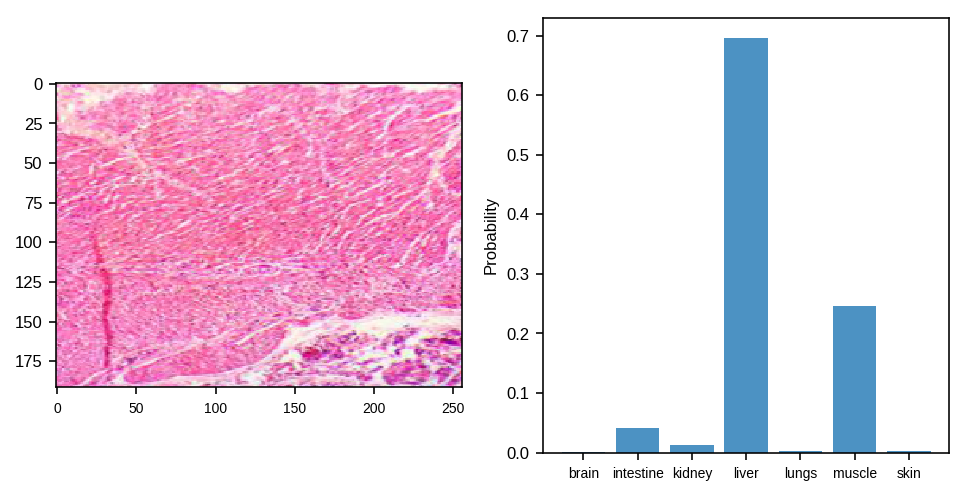

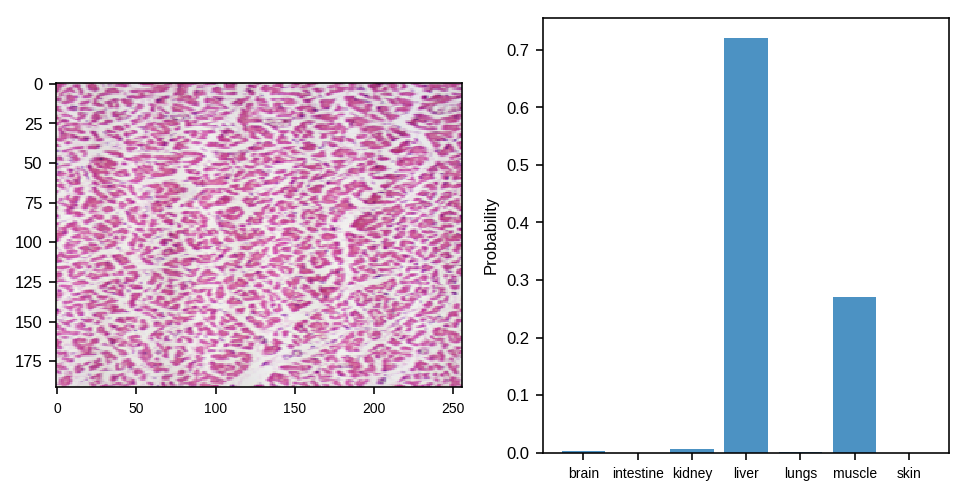

...

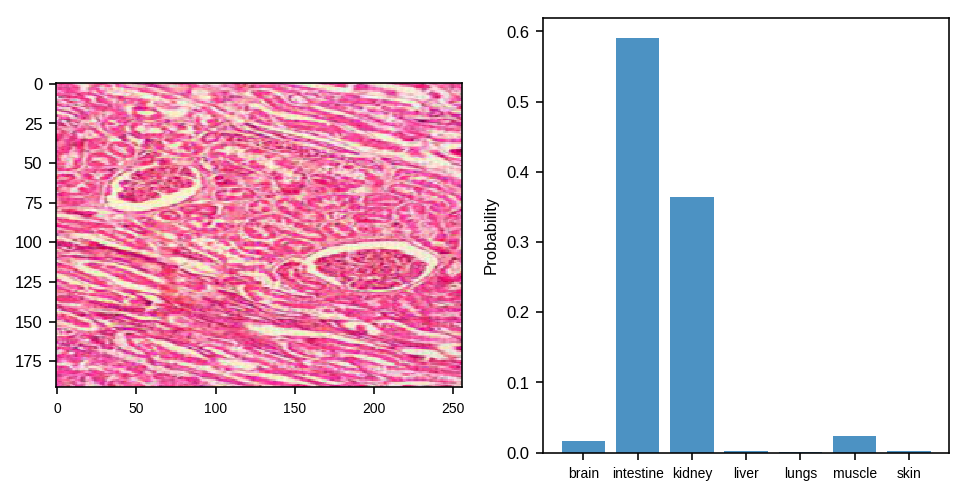

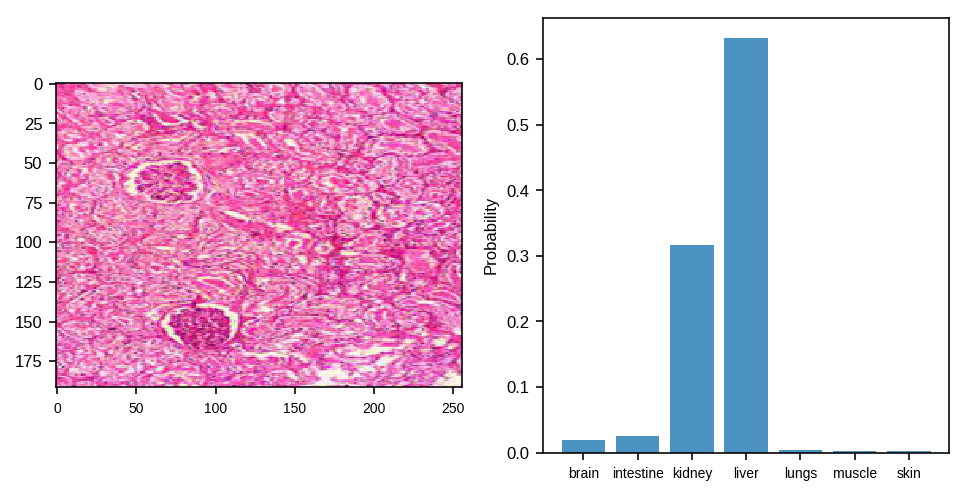

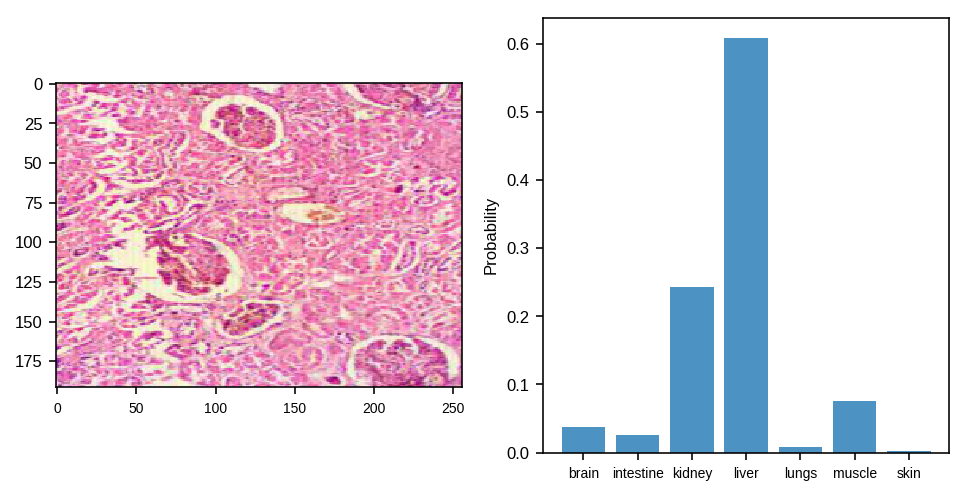

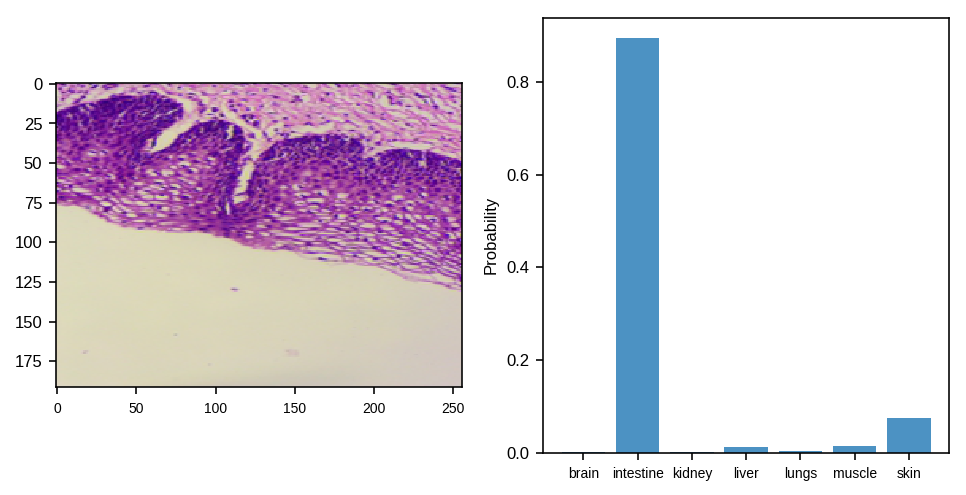

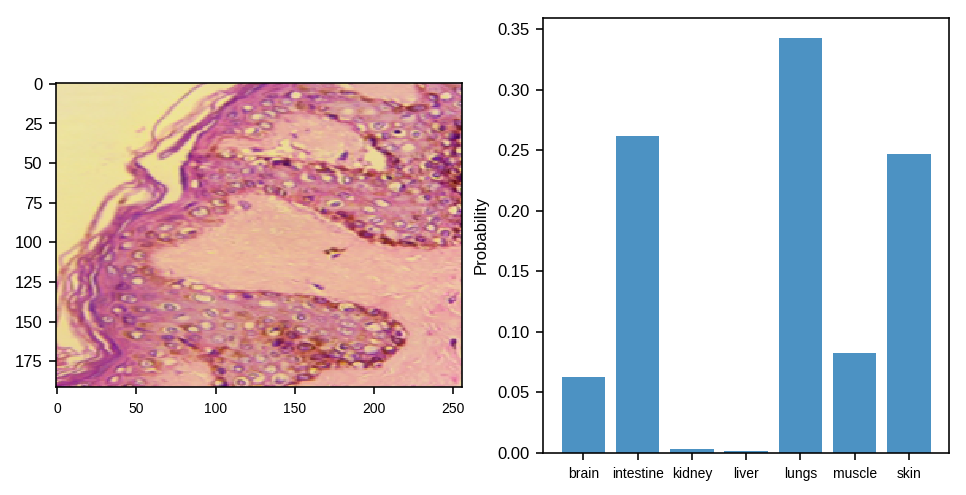

In [0]:
params = {'legend.fontsize': 'medium',
         'axes.labelsize': 'small',
         'axes.titlesize':'medium',
         'xtick.labelsize':'x-small',
         'ytick.labelsize':'small',
         'font.family':'liberation sans'}
hfont = {'fontname':'liberation sans'}
pylab.rcParams.update(params)

wrongs = [74,75,82,97,112,118,269,274,301,302,305,324,329,335,339,350,435,453]
for i in wrongs:
  p = learn.predict(learn.data.valid_ds[i][0])
  im = learn.data.valid_ds[i][0]
  im = (im.data).numpy()
  im = im.T
  probs = p[2]
  y_pos = np.arange(len(data.classes))
  
  
  plt.figure(dpi=144,figsize=(8,4))
  plt.subplot(121)
  plt.imshow(im)
  plt.subplot(122)
  plt.xticks(y_pos,data.classes,**hfont)
  plt.ylabel('Probability',**hfont)
  plt.yticks(**hfont)
  plt.bar(y_pos,probs.tolist(),alpha=0.8)
  plt.show()

## Show intermediate layers with an example

In [0]:
layers  =  flatten_model(learn.model)
from fastai.callbacks import hook_outputs
custom_hook = hook_outputs(layers)

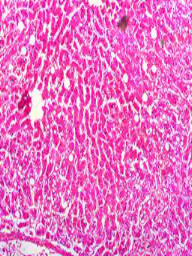

In [0]:
img = learn.data.valid_ds[2][0]
img

In [0]:
p = learn.predict(img)
p

(Category liver,
 tensor(3),
 tensor([0.0496, 0.0107, 0.0581, 0.8114, 0.0012, 0.0660, 0.0029]))

In [0]:
custom_hook.stored

[tensor([[[[-7.3828e-01, -2.6270e-01, -2.8926e+00,  ..., -4.6704e-01,
             1.6028e-01, -4.8737e-02],
           [-2.2578e+00, -1.4717e+00, -1.4570e+00,  ..., -8.4814e-01,
             5.5322e-01,  1.4805e+00],
           [-1.1279e+00,  1.9922e-01,  2.3984e+00,  ..., -1.8447e+00,
            -3.3594e+00, -2.0879e+00],
           ...,
           [ 2.8262e+00,  3.7051e+00,  3.4707e+00,  ..., -1.1279e+00,
             1.4050e-01,  1.1243e-01],
           [-1.5713e+00, -5.9961e-01,  7.7295e-01,  ..., -7.5928e-01,
            -1.6152e+00, -7.3291e-01],
           [-4.4062e+00, -6.3867e+00, -5.2266e+00,  ..., -1.7568e+00,
            -3.1348e+00, -2.2539e+00]],
 
          [[-2.5610e-01, -2.3516e+00,  3.3320e+00,  ..., -2.2773e+00,
             1.7607e+00, -2.3926e+00],
           [-3.8379e-01, -3.8848e+00,  5.0938e+00,  ..., -2.5469e+00,
             3.3848e+00, -3.1523e+00],
           [-1.3994e+00, -2.2988e+00,  4.8438e+00,  ...,  3.6523e-01,
             2.1914e+00, -3.9570e+00],


In [0]:
cmap = 'inferno'
stored_hooks_rank = [len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))]
min_rank = min([len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))])
first_flat_layer = stored_hooks_rank.index(min_rank); first_flat_layer

92

In [0]:
l0 = (custom_hook.stored[0]).tolist()

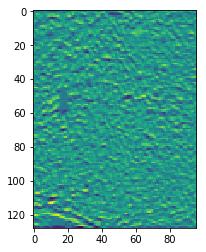

In [0]:
plt.imshow(l0[0][0])

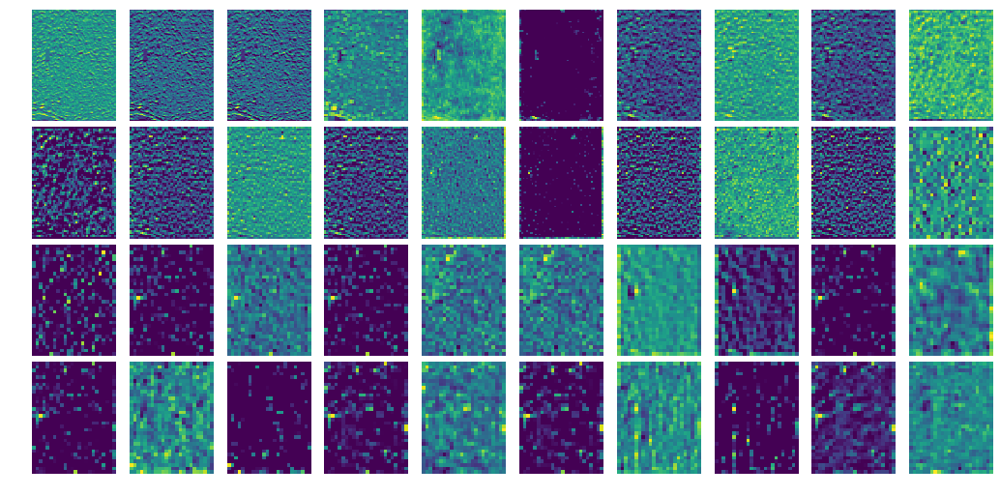

In [0]:
l=0
nrows = 4
ncols = 10
s = 20 #figsize
fig, axes = plt.subplots(nrows, ncols, figsize=(s,s/3))
fig.subplots_adjust(hspace=0.05, wspace=0, left=0, right=0.7, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
  ax.imshow(((custom_hook.stored[i]).tolist())[0][0])
  ax.set_axis_off()

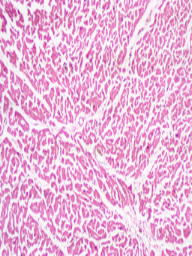

In [0]:
img = learn.data.valid_ds[74][0]
img

In [0]:
p = learn.predict(img)
p

(Category liver,
 tensor(3),
 tensor([3.0279e-03, 6.9866e-05, 4.2820e-03, 7.1566e-01, 3.1992e-04, 2.7645e-01,
         1.9066e-04]))

In [0]:
cmap = 'inferno'
stored_hooks_rank = [len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))]
min_rank = min([len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))])
first_flat_layer = stored_hooks_rank.index(min_rank); first_flat_layer

92

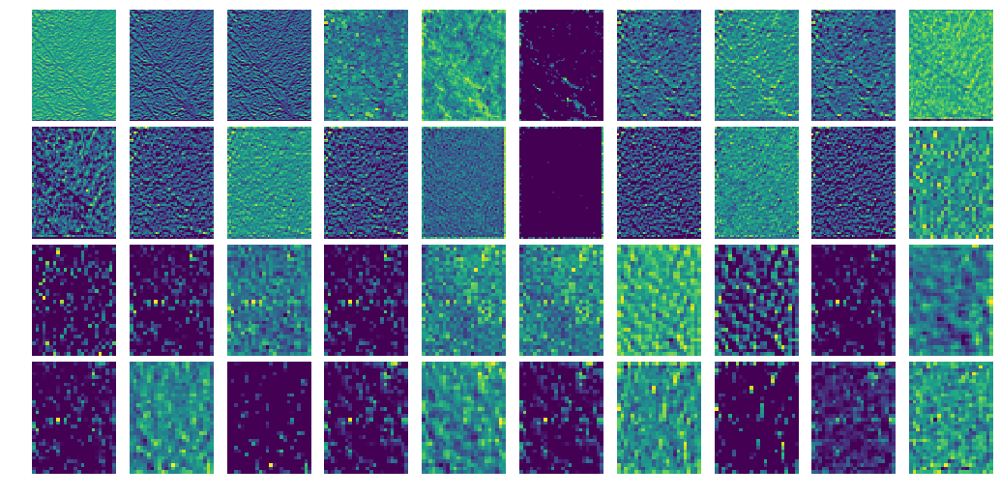

In [0]:
l=0
nrows = 4
ncols = 10
s = 20 #figsize
fig, axes = plt.subplots(nrows, ncols, figsize=(s,s/3))
fig.subplots_adjust(hspace=0.05, wspace=0, left=0, right=0.7, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
  ax.imshow(((custom_hook.stored[i]).tolist())[0][0])
  ax.set_axis_off()

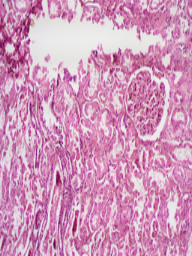

In [0]:
img = learn.data.valid_ds[329][0]
img

In [0]:
p = learn.predict(img)
p

(Category lungs,
 tensor(4),
 tensor([0.0076, 0.1573, 0.1551, 0.0260, 0.6487, 0.0010, 0.0043]))

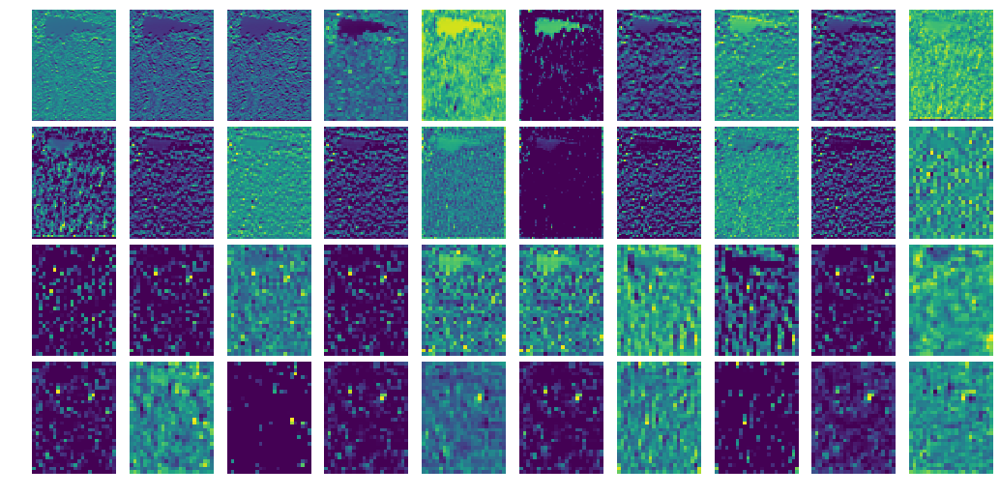

In [0]:
l=0
nrows = 4
ncols = 10
s = 20 #figsize
fig, axes = plt.subplots(nrows, ncols, figsize=(s,s/3))
fig.subplots_adjust(hspace=0.05, wspace=0, left=0, right=0.7, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
  ax.imshow(((custom_hook.stored[i]).tolist())[0][0])
  ax.set_axis_off()